# Crime Patterns across England: A Spatial Postcode Sector Analysis

This is the final assignment for the UCL CASA module Data Science for Spatial Systems (CASA0006)_

This paper explores the methods and results of an exploratory clustering analysis to understand key features of crime data across the UK

The original code is hosted [here](https://github.com/LillyCacciasaurus/CASA0006_Data_Science_Project)<br>
The data used in this project is available [here](https://liveuclac-my.sharepoint.com/personal/uclqacc_ucl_ac_uk/_layouts/15/onedrive.aspx?id=%2Fpersonal%2Fuclqacc%5Fucl%5Fac%5Fuk%2FDocuments%2FCASA%5FDSSS)

_There is a table of contents included for ease of navigation through the notebook._


## Introduction <a class="anchor" id="Introduction"></a>

This paper describes the methodologies and results of an exploratory analysis of crime figures in the UK, in order to understand the various factors that contribute to crime levels by postcode sector, across the United Kingdom. 

This paper uses open source data from the Office of National Statistics, and various other reputable data sources, to generate clusters of varying crime rates across the UK. 

Finding from the report indicate a wide variety of spacing between centroids, with a larger value of K. 

_The structure of the report includes contextual information in the main body of the paper, and technical steps and commentary accompanying the code itself, for ease of comprehension._  


### Libraries Used: 

A complete list of the packages used within this notebook, with an overview of their function

In [221]:
#Calulations
import pandas as pd
import numpy as np
import pysal as ps

#Geodata
import geopandas #as pd
import geopy
import folium

#Plotting
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy

#API data
import json
import requests
import geojson

#Kmeans clustering
from sklearn import preprocessing
from sklearn.cluster import KMeans

#Scaling data
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from bioinfokit.analys import get_data
from sklearn import cluster
from sklearn.preprocessing import scale

sns.set(style="whitegrid")

## Literature Review <a class="anchor" id="Literature_Review"></a>



The specifics of how crime is conducted changes depending on the type of society and community, with geographical variations being a crucial gap in the understanding of crime. The analysis of these factors is essential for understanding and ultimately preventing these occurrences, with appropriate police and community action. 

A major challenge regarding crime is analyzing large crime datasets accurately and efficiently. A large number of studies that seek to understand crime rates, do so on a national basis, using variance factors such as crime rates and the number of bus stops in a certain city, as well as techniques such as profiling individual criminals (Boni and Gerber, 2016). These analyses have their uses, but often fail to take into account spatial factors at finer resolutions (e.g. postcodes) of the area in which the crime is committed. However,this global correlation between areas  might not hold within each sub-area, meaning that one solution might work in one test area, and is difficult to replicate across the country with the same results. Brantingham & Brantingham argue that crimes have an inherently spatial component. Rossmo goes further and indicates that geographic profiling can play a dominant role in solving major crimes. (Rossmo, 2013)

Crime is conducted depending on the type of society, community and geographic area, meaning that spatial and demographic. According to Brantingham and Brantingham, crime rates are features of the neighbourhood conditions rather than inherent features of the individuals who reside there, meaning that spatial analysis is important in preventing crime, as well as individual profiling. (Brantingham, and Brantingham, 1981). Criminal analyses can influence the allocation of resources, e.g. police forces and community funding. One study was able to predict crime hotspots using demographic and geospatial factors along with mobile network activity. (Bogomolov et al, 2014). 


### Data and Enquiry:

Choosing the size of areas to analyse is a crucial part of the investigation. Smaller areas produce fewer crimes and therefore are more difficult to analyse effectively. However, the accuracy of specific crime reduces as the area increases (Chen et al., 2004). Many researchers use city districts to tackle this problem. 

Therefore, the data set utilised in this task collates crime by Postcode sectors. Whilst it varies across the UK, there are around 3000 addresses in each sector. Each sector in this dataset includes data like Postcode sectors, regions, Wards, and the various types of crimes committed in those areas. 

The main objectives of these kinds of studies is to extract crime patterns that are hidden from human perception by analysis of available crime and criminal data, and therefore predict crime based on spatial distribution of existing data and anticipation of crime rate, across spatial boundaries. (Corcoran, Wilson and Ware, 2003). This type of analysis has been deployed in various cities, including Vancouver, Canada, whose Police Department (VPD) introduced a crime-predictive model to predict crimes related to property break-ins and, once implemented, the city of Vancouver witnessed a 27% drop in residential break-ins, by their use of geospatial data mapping. (Kerr, 2021).

Crime hot spot maps can most effectively guide police action when production of the maps is guided by crime theories (place, victim, street, or neighborhood). (John et al., n.d.) There have been numerous links to the role of sociodemographic factors such as poverty in relation to crime (Mundia et al., 2016). An important addition to this analysis is the IMD SCore (Indices of Multiple Deprivation) which is the most widely used statistical indicator for small areas in England (Ministry of Housing, Communities & Local Government, 2019). this statistic is also often used in analysis of crime patterns (Understanding Herefordshire, 2021). These datasets are merged together, using corresponding area codes, to create the final dataset used in the analysis section of the report. 


### Research Questions

Therefore, this leads to the research question: 

 **How can you identify areas of the country that are higher risk for certain incidents of crime?**

The methods for outlining this question is outlined in the following section.


### Methodology <a class="anchor" id="Methodology"></a>

The main aim for the research project is to identify patterns of crime, which is best achieved through clustering analysis. Whilst clustering can be utilised through either a supervised or unsupervised approach, the aim of the analysis is to find hidden features unseen by human perception. Since there are no ‘ground truths’ on which to analyse our data, and the aim of the analysis is to find unseen patterns, an unsupervised learning approach is the best course of action. Inspired by the work published by Ankerst et al.31, the author proposes a cluster-then-label based SSL method that works by finding the underlying structure of points (clusters of points forming high density regions) in the data space.https://www.nature.com/articles/s41598-018-24876-0

Kmeans is one of the most popular and efficient clustering methods is the K-means method, due to its accuracy and fast processing times (Hartigan & Wang, 1979; Lloyd, 1957; MacQueen, 1967) which uses prototypes (centroids) to represent clusters by optimizing the squared error function. Cluster analysis attempts to pass through data quickly to gain first order knowledge by partitioning data points into disjoint groups such that data points belonging to same cluster are similar while data points belonging to different clusters are dissimilar. (Ding et al, n.d.)

The process for this section will go as follows: 

1. Select the appropriate number of clusters
2. Carry out the clustering, and map the labels onto the dataset
3. Visualise the results in order to identify areas for improvement

Another method utilised in this report is Principal Component Analysis, in order to identify the types of crimes most relevant to the clustering analysis and avoid the curse of dimensionality. Dimension reduction eliminates noisy data,  and thus and improves accuracy in classification and clustering, in addition to reduced computational cost. Here the focus is on unsupervised dimension reduction. The wide used technique is principal component analysis which is closely related to K-means cluster (Ding, C. n.d.).

In order to conduct the analysis, the below takes the reader through the process of extracting the data, cleaning it, processing it, in order to prepare it for principal component analysis and then clustering analysis. Unlike other forms of clustering, K-means requires the number of clusters expected in the main datasets. A number of tests are then conduced to establish whether the clusters fit within the context of the analysis. 

## Data Gathering <a class="anchor" id="Data Gathering"></a>


Because of the nature of the global pandemic, and that fact that crime has changed so drastically (Kirchmaier and Villa-Llera, 2020) and it is as of yet unknown the long term impacts of such an unprecedented situation, it was the opinion of the author that data in this period be excluded, with the aim that in the future, such analysis is possible in a more holistic fashion, taking into account the nature of the crime changes. As such, the crime data included will be from January 2010 (earliest available) to December 2019. The main dataset includes data from January 2010, to December 2019 on crime data across the UK.

_Please note_: In order to include the IMD (Indices of Multiple Deprivation) data in the main dataset according to the postcode sector, a connective dataset with the various area codes was used. The specific datasets are highlighted in comments throughout the dataset, and are merged in the ‘Merging Dataframes’ section.


**Main dataset**: Name = Crime_Postcodesectors, raw data available [here](https://www.ukcrimestats.com/Postcode_Sectors/)

_Connection Dataset 1_: Name = AreatoPostcode, raw data available [here](https://geoportal.statistics.gov.uk/datasets/82b34e51b438420cbd9db471e8f3a974_0)


_Connection Dataset 2_: Name = GeoData, raw data available [here](https://geoportal.statistics.gov.uk/datasets/fe6c55f0924b4734adf1cf7104a0173e_0)

**IMD Dataset**: Name = DeprivationData, raw data available [here](https://data.gov.uk/dataset/c84b4e22-e3a7-44f0-a880-833ab3780f58/indices-of-deprivation/datafile/22d40029-c9ee-43a4-8d3b-c606c75935c6/preview) 


The four datasets will be visualised below, with the majority of processing performed on the main dataset. 


### Visualising the Datasets

Reading the main dataset: 

In [5]:
dataA=pd.read_csv('Crime_postcodesectors.csv')
dataA.head(2)

,Postcode Sector,Region,Wards,Population,Land Area in Hectares,Anti-Social Behaviour,Burglary,Robbery,Vehicle Crimes,Violent Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total Crime & ASB
0,W9 4,Westminster,Maida Vale,NaN,NaN,9614,3519,1359,6263,13031,2934,8140,10796,5462,3368,0,0,0,0,67243
1,E15 1,Newham,Cann Hall Ward Forest Gate North Ward Forest...,14005.0,233.32,8207,1617,1725,2624,6145,5176,1387,7548,1669,1573,780,213,1121,3441,43508


Connection Dataset 1: This dataset contains area codes, specifically 'OA11CD' or 'output area code', which will allow for the IMD (Indices of Multiple Deprivation) dataset to be merged with the main dataset

In [6]:
AreatoPostcode=pd.read_csv('Output_Area_to_Postcode_Sector.csv', low_memory = False) 
AreatoPostcode.head(2)

,OA11CD,PCDS11CD,ObjectId,Unnamed: 3
0,E00000215,RM9 4,1,NaN
1,E00000216,IG119,2,NaN


Connection Dataset 2: This dataset contains Geocodes,specfically 'LSOA11CD' or 'Lower Super Output Area', which will allow for the IMD (Indices of Multiple Deprivation) dataset to be merged with the main dataset.

In [7]:
GeoData = pd.read_csv('Output_Area_to_Lower_Layer_Super_Output_Area_to_Middle_Layer_Super_Output_Area_to_Local_Authority_District_(December_2011)_Lookup_in_England_and_Wales.csv', low_memory = False)
GeoData.head(2)

,OA11CD,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,LAD11NMW,ObjectId
0,E00000001,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,NaN,1
1,E00000003,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,NaN,2


IMD Dataset: The column needed is 'IMD score', which is a mark out of ten. This dataset can be connected by the Lower Super Output Area, or LSOA code, to the main dataset

In [8]:
Deprivationdata = pd.read_csv('Indices_of_Multiple_Deprivation.csv')
Deprivationdata.head(2)

,FID,lsoa11cd,lsoa11nm,lsoa11nmw,st_areasha,st_lengths,IMD_Rank,IMD_Decile,LSOA01NM,LADcd,...,OutScore,OutRank,OutDec,TotPop,DepChi,Pop16_59,Pop60_,WorkPop,Shape__Area,Shape__Length
0,30526,E01031349,Adur 001A,Adur 001A,385446.0409,3418.309918,21612,7,Adur 001A,E07000223,...,0.219,11851,4,1326,207,695,424,707.50,965512.4009,5408.183769
1,30527,E01031350,Adur 001B,Adur 001B,318478.5609,3248.799760,8975,3,Adur 001B,E07000223,...,0.478,8632,3,1205,228,686,291,697.75,797959.7310,5142.398216


### Data Preprocessing

In order to prepare the data for analysis, it must be cleaned, merged and processed. This includes finidng missing values, and droppin guseless columns from the main dataset. The code below takes the reader through this process.

**Main Dataset:** Data Preprocessing


In [10]:
#For convenience, the complex column names are changed to something shorter 

dataA = dataA.rename(columns={'Postcode Sector' : 'Postcode' , 'Land Area in Hectares' : 'Land_Area', 'Anti-Social Behaviour' : 'ASB', 'Total Crime & ASB' : 'Total_Crime', 'Vehicle Crimes' : 'Vehicle_Crimes', 'Violent Crimes' : 'Violent_Crimes',})

#drop useless columns
dataA = dataA.drop(columns=['Region', 'Wards' ], axis =1) 
dataA.head(2)

,Postcode,Population,Land_Area,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime
0,W9 4,NaN,NaN,9614,3519,1359,6263,13031,2934,8140,10796,5462,3368,0,0,0,0,67243
1,E15 1,14005.0,233.32,8207,1617,1725,2624,6145,5176,1387,7548,1669,1573,780,213,1121,3441,43508


In [11]:
#Then we use the sort() function to sort the data alphabetically by postcode. This is in order to make the merge funcitoning easier

dataA = dataA.sort_values("Postcode", ascending=True)
dataA.head(2)

,Postcode,Population,Land_Area,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime
4801,AL1 1,5744.0,225.63,1349,374,54,456,683,107,321,401,167,180,62,39,159,53,4408
3777,AL1 2,6600.0,286.59,1937,337,43,452,920,480,424,518,163,275,104,68,176,34,5933


**Dataset Shape:**  

In [12]:
#Then we use the info() function to check the missing value and dtpye of each column of the data.
dataA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10507 entries, 4801 to 9636
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Postcode                 10507 non-null  object 
 1   Population               8474 non-null   float64
 2   Land_Area                8032 non-null   float64
 3   ASB                      10507 non-null  int64  
 4   Burglary                 10507 non-null  int64  
 5   Robbery                  10507 non-null  int64  
 6   Vehicle_Crimes           10507 non-null  int64  
 7   Violent_Crimes           10507 non-null  int64  
 8   Shoplifting              10507 non-null  int64  
 9   Criminal Damage & Arson  10507 non-null  int64  
 10  Other Theft              10507 non-null  int64  
 11  Drugs                    10507 non-null  int64  
 12  Other Crimes             10507 non-null  int64  
 13  Bike Theft               10507 non-null  int64  
 14  Weapons             

An inconsistency appears in the number of rows for population and land area 

In [13]:
#The .count() function is used to calculate the number of non-null values for each column.
dataA.count() 

Postcode                   10507
Population                  8474
Land_Area                   8032
ASB                        10507
Burglary                   10507
Robbery                    10507
Vehicle_Crimes             10507
Violent_Crimes             10507
Shoplifting                10507
Criminal Damage & Arson    10507
Other Theft                10507
Drugs                      10507
Other Crimes               10507
Bike Theft                 10507
Weapons                    10507
Order                      10507
Theft From Person          10507
Total_Crime                10507
dtype: int64

It is recommended to use the median value to replace missing values, as there are several outliers in the data due to distribution of [statitsics](https://vitalflux.com/pandas-impute-missing-values-mean-median-mode/)<br>

In [14]:
#Replace missing values with the median of the data

median = dataA['Population'].median()
dataA['Population'].fillna(median, inplace=True)

median = dataA['Land_Area'].median()
dataA['Land_Area'].fillna(median, inplace=True)

dataA.head(2)

,Postcode,Population,Land_Area,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime
4801,AL1 1,5744.0,225.63,1349,374,54,456,683,107,321,401,167,180,62,39,159,53,4408
3777,AL1 2,6600.0,286.59,1937,337,43,452,920,480,424,518,163,275,104,68,176,34,5933


In [15]:
#now there are no missing values, which can interfere with analysis
dataA.count()

Postcode                   10507
Population                 10507
Land_Area                  10507
ASB                        10507
Burglary                   10507
Robbery                    10507
Vehicle_Crimes             10507
Violent_Crimes             10507
Shoplifting                10507
Criminal Damage & Arson    10507
Other Theft                10507
Drugs                      10507
Other Crimes               10507
Bike Theft                 10507
Weapons                    10507
Order                      10507
Theft From Person          10507
Total_Crime                10507
dtype: int64

**Data Types**

In [16]:
dataA.dtypes

Postcode                    object
Population                 float64
Land_Area                  float64
ASB                          int64
Burglary                     int64
Robbery                      int64
Vehicle_Crimes               int64
Violent_Crimes               int64
Shoplifting                  int64
Criminal Damage & Arson      int64
Other Theft                  int64
Drugs                        int64
Other Crimes                 int64
Bike Theft                   int64
Weapons                      int64
Order                        int64
Theft From Person            int64
Total_Crime                  int64
dtype: object

The 'population' column is shown here as a 'float', when it should be an 'int64'

In [18]:
#converting datatypes
for c in ['Population','ASB', 'Burglary', 'Robbery', 'Vehicle_Crimes', 'Violent_Crimes', 'Shoplifting', 'Criminal Damage & Arson', 'Other Theft', 'Drugs', 'Bike Theft', 'Weapons', 'Order', 'Theft From Person', 'Total_Crime']:
    dataA[c] = dataA[c].astype('int64')

In [19]:
dataA.dtypes

Postcode                    object
Population                   int64
Land_Area                  float64
ASB                          int64
Burglary                     int64
Robbery                      int64
Vehicle_Crimes               int64
Violent_Crimes               int64
Shoplifting                  int64
Criminal Damage & Arson      int64
Other Theft                  int64
Drugs                        int64
Other Crimes                 int64
Bike Theft                   int64
Weapons                      int64
Order                        int64
Theft From Person            int64
Total_Crime                  int64
dtype: object

**Connection Dataset 1:** Data Preprocessing

The Connection Dataset 1: Name = AreatoPostcode dataset will be merged with the main dataset in order to provide the 'OA11CD' geocode. Initially, however, it must be cleaned and processed. 

In [20]:
AreatoPostcode=pd.read_csv('Output_Area_to_Postcode_Sector.csv', low_memory = False) 
AreatoPostcode.head(2)

,OA11CD,PCDS11CD,ObjectId,Unnamed: 3
0,E00000215,RM9 4,1,NaN
1,E00000216,IG119,2,NaN


In [21]:
#Drop useless columns
AreatoPostcode = AreatoPostcode.drop(columns=['ObjectId','Unnamed: 3'], axis =1)
AreatoPostcode.head(2)

,OA11CD,PCDS11CD
0,E00000215,RM9 4
1,E00000216,IG119


In [22]:
# rename columns in order to be able to merge with the main dataset
AreatoPostcode = AreatoPostcode.rename(columns={'PCDS11CD' :'Postcode'}) 
AreatoPostcode.head(2)

,OA11CD,Postcode
0,E00000215,RM9 4
1,E00000216,IG119


In [24]:
#check for duplicates and delete them 
AreatoPostcode = AreatoPostcode.sort_values("Postcode", ascending=True) 
AreatoPostcode.head(5)

,OA11CD,Postcode
117342,E00120494,AL1 1
117321,E00120491,AL1 1
117490,E00120561,AL1 1
117179,E00120279,AL1 1
117148,E00120264,AL1 1


From the sort there seems to be several 'AL1' values, which indicate duplicate values, which need to be deleted prior to merging. This is confirmed using the .describe() function on one of the columns

In [25]:
#delete duplicate rows 
AreatoPostcode = AreatoPostcode.drop_duplicates(subset=['Postcode'], keep='first')
AreatoPostcode.head(2)

,OA11CD,Postcode
117342,E00120494,AL1 1
117460,E00120555,AL1 2


In [26]:
AreatoPostcode.count

<bound method DataFrame.count of            OA11CD Postcode
117342  E00120494    AL1 1
117460  E00120555    AL1 2
117255  E00120488    AL1 3
116929  E00120236    AL1 4
117125  E00120262    AL1 5
...           ...      ...
138181  E00142182    YO8 4
138282  E00142146    YO8 5
138134  E00142129    YO8 6
138094  E00142106    YO8 8
138097  E00142109    YO8 9

[8035 rows x 2 columns]>

In [29]:
AreatoPostcode['Postcode'].describe()

count      8035
unique     8035
top       CF642
freq          1
Name: Postcode, dtype: object

In [28]:
AreatoPostcode['OA11CD'].describe()

count          8035
unique         8035
top       E00006216
freq              1
Name: OA11CD, dtype: object

Both datatypes have the same number of datapoints, and are of the correct datatype. No further cleaning is needed. 

**Connection Dataset 2:** Data Preprocessing

This dataset will allow the IMD dataset to be merged with the main dataset

In [31]:
GeoData = pd.read_csv('Output_Area_to_Lower_Layer_Super_Output_Area_to_Middle_Layer_Super_Output_Area_to_Local_Authority_District_(December_2011)_Lookup_in_England_and_Wales.csv', low_memory = False)
GeoData.head(2)

,OA11CD,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,LAD11NMW,ObjectId
0,E00000001,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,NaN,1
1,E00000003,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,NaN,2


In [32]:
#drop the useless columns
GeoData = GeoData[['OA11CD', 'MSOA11CD', 'LSOA11CD']]
GeoData.head(2)

,OA11CD,MSOA11CD,LSOA11CD
0,E00000001,E02000001,E01000001
1,E00000003,E02000001,E01000001


In [34]:
#check for same datatype for the useful column. Okay to proceed. This dataset is now ready for merging
GeoData['OA11CD'].describe() 

count        181408
unique       181408
top       E00066653
freq              1
Name: OA11CD, dtype: object

**IMD Dataset:** Data Preprocessing

In [35]:
#viewing the dataset
Deprivationdata.head(2)

,FID,lsoa11cd,lsoa11nm,lsoa11nmw,st_areasha,st_lengths,IMD_Rank,IMD_Decile,LSOA01NM,LADcd,...,OutScore,OutRank,OutDec,TotPop,DepChi,Pop16_59,Pop60_,WorkPop,Shape__Area,Shape__Length
0,30526,E01031349,Adur 001A,Adur 001A,385446.0409,3418.309918,21612,7,Adur 001A,E07000223,...,0.219,11851,4,1326,207,695,424,707.50,965512.4009,5408.183769
1,30527,E01031350,Adur 001B,Adur 001B,318478.5609,3248.799760,8975,3,Adur 001B,E07000223,...,0.478,8632,3,1205,228,686,291,697.75,797959.7310,5142.398216


In [37]:
#get the columns that we need
Deprivationdata1 = Deprivationdata[['lsoa11cd', 'IMD_Rank', 'IMDScore']]
Deprivationdata1.head(3)

,lsoa11cd,IMD_Rank,IMDScore
0,E01031349,21612,12.500
1,E01031350,8975,28.103
2,E01031351,21496,12.603


In [38]:
#confirm the same names of postcodes and sort
Deprivationdata1 = Deprivationdata1.sort_values("lsoa11cd", ascending=True) 
Deprivationdata1.head(3) 

,lsoa11cd,IMD_Rank,IMDScore
6738,E01000001,29199,6.208
6739,E01000002,30379,5.143
6740,E01000003,14915,19.402


In [39]:
Deprivationdata1.shape

(32844, 3)

In [40]:
#Checking the shape and datatype, okay to proceed.
Deprivationdata1.count()

lsoa11cd    32844
IMD_Rank    32844
IMDScore    32844
dtype: int64

## Data Processing<a class="anchor" id="Data Processing"></a>


### Population Density:

Population density is a more useful factor than simply population and land area, as it can be directly compared to other sectors. Therefore, a new dataframe needs to be created from the main dataset, processed and merged with the main dataset.

This temporary dataset will be named 'dataB'

In [48]:
#create a temporary dataset from the main dataset
dataB = dataA.iloc[0:,0:5]
dataB["Population Density"] = dataA["Population"] / dataA["Land_Area"] #this will be merged later 
dataB.head(2)

,Postcode,Population,Land_Area,ASB,Burglary,Population Density
4801,AL1 1,5744,225.63,1349,374,25.457608
3777,AL1 2,6600,286.59,1937,337,23.029415


In [49]:
#drop the useless columns from the dataset, keeping only the common value 'Postcode' in order to merge the datasets
dataB = dataB.drop(columns=['Population', 'Land_Area', 'ASB', 'Burglary' ], axis =1) 
dataB.head(2) 

,Postcode,Population Density
4801,AL1 1,25.457608
3777,AL1 2,23.029415


### Merging Dataframes

****Population Density:**** Merging population density with the main dataset. The main dataset will now be called df1

In [51]:
#the join is a left join, because all the data from the main dataset dataA will be kept, whilst only the matching data from dataB will be kept
df1 = pd.merge(dataA , dataB , on=['Postcode'], how = 'left')
df1.head(2)

,Postcode,Population,Land_Area,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density
0,AL1 1,5744,225.63,1349,374,54,456,683,107,321,401,167,180,62,39,159,53,4408,25.457608
1,AL1 2,6600,286.59,1937,337,43,452,920,480,424,518,163,275,104,68,176,34,5933,23.029415


**Connection dataset 1: Area to Postcode** Merge to get the area codes

In [52]:
#this type of merging requires an inner join, as only certain area codes in the Connection 2 dataset are available
df3 = pd.merge(AreatoPostcode, df1 , on=['Postcode'], how = 'inner')
df3.head(3)

,OA11CD,Postcode,Population,Land_Area,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density
0,E00120494,AL1 1,5744,225.63,1349,374,54,456,683,107,321,401,167,180,62,39,159,53,4408,25.457608
1,E00120555,AL1 2,6600,286.59,1937,337,43,452,920,480,424,518,163,275,104,68,176,34,5933,23.029415
2,E00120488,AL1 3,4239,97.12,2790,323,53,300,1479,734,510,695,353,471,150,84,400,144,8491,43.647035


In [53]:
#checking that there are the same number of values in each column, to avoid issues later in analysis
df3.count()

OA11CD                     3961
Postcode                   3961
Population                 3961
Land_Area                  3961
ASB                        3961
Burglary                   3961
Robbery                    3961
Vehicle_Crimes             3961
Violent_Crimes             3961
Shoplifting                3961
Criminal Damage & Arson    3961
Other Theft                3961
Drugs                      3961
Other Crimes               3961
Bike Theft                 3961
Weapons                    3961
Order                      3961
Theft From Person          3961
Total_Crime                3961
Population Density         3961
dtype: int64

**Connection dataset 2: Geodata data** contains the codes that we need (OA11CD + LSOA11CD)

In [54]:
#merge the Geodata dataset onto the main dataset
df1 = pd.merge(df3,GeoData, on='OA11CD', how='left') 
df1.head(3)

,OA11CD,Postcode,Population,Land_Area,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,...,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,MSOA11CD,LSOA11CD
0,E00120494,AL1 1,5744,225.63,1349,374,54,456,683,107,...,167,180,62,39,159,53,4408,25.457608,E02004935,E01023726
1,E00120555,AL1 2,6600,286.59,1937,337,43,452,920,480,...,163,275,104,68,176,34,5933,23.029415,E02004940,E01023738
2,E00120488,AL1 3,4239,97.12,2790,323,53,300,1479,734,...,353,471,150,84,400,144,8491,43.647035,E02004935,E01023726


In [55]:
df1.shape 

(3961, 22)

**Merging Deprivation Data**: Once all the geocodes are in place, we can add in the deprivation data

In [64]:
Deprivationdata1.head(2)

,LSOA11CD,IMD_Rank,IMDScore
6738,E01000001,29199,6.208
6739,E01000002,30379,5.143


In [65]:
#check for any missing values 
Deprivationdata1['IMDScore'].isnull().values.any()

False

In [66]:
Deprivationdata1.eq(0).any().any()
Out[173]: True

In [67]:
0 in Deprivationdata1.values

False

In [68]:
#renaming the columns so that they can be recognised by the merge function
Deprivationdata1 = Deprivationdata1.rename(columns={'lsoa11cd' : 'LSOA11CD'}) 
Deprivationdata1.head(3) 

,LSOA11CD,IMD_Rank,IMDScore
6738,E01000001,29199,6.208
6739,E01000002,30379,5.143
6740,E01000003,14915,19.402


In [69]:
Deprivationdata1.count()

LSOA11CD    32844
IMD_Rank    32844
IMDScore    32844
dtype: int64

In [70]:
df1.count()

OA11CD                     3961
Postcode                   3961
Population                 3961
Land_Area                  3961
ASB                        3961
Burglary                   3961
Robbery                    3961
Vehicle_Crimes             3961
Violent_Crimes             3961
Shoplifting                3961
Criminal Damage & Arson    3961
Other Theft                3961
Drugs                      3961
Other Crimes               3961
Bike Theft                 3961
Weapons                    3961
Order                      3961
Theft From Person          3961
Total_Crime                3961
Population Density         3961
MSOA11CD                   3961
LSOA11CD                   3961
dtype: int64

In [71]:
#Merging dataset for deprivation data onto main dataset 
df4 = pd.merge(Deprivationdata1, df1, on='LSOA11CD', how='inner') 
df4.head(3)

,LSOA11CD,IMD_Rank,IMDScore,OA11CD,Postcode,Population,Land_Area,ASB,Burglary,Robbery,...,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,MSOA11CD
0,E01000017,4570,39.004,E00000078,RM9 5,11957,201.32,3003,852,403,...,657,416,620,104,37,298,109,11139,59.393006,E02000010
1,E01000034,5575,35.895,E00000195,RM7 0,11034,416.80,2991,1115,264,...,1080,401,422,99,49,429,89,11783,26.473129,E02000004
2,E01000054,8124,29.788,E00000286,RM9 6,11509,132.51,4015,1022,463,...,1251,305,686,137,64,411,122,15640,86.853822,E02000019


In [72]:
#Shape is good to proceed 
df4.shape

(3867, 24)

In [73]:
#count is good to proceed
df4.count()

LSOA11CD                   3867
IMD_Rank                   3867
IMDScore                   3867
OA11CD                     3867
Postcode                   3867
Population                 3867
Land_Area                  3867
ASB                        3867
Burglary                   3867
Robbery                    3867
Vehicle_Crimes             3867
Violent_Crimes             3867
Shoplifting                3867
Criminal Damage & Arson    3867
Other Theft                3867
Drugs                      3867
Other Crimes               3867
Bike Theft                 3867
Weapons                    3867
Order                      3867
Theft From Person          3867
Total_Crime                3867
Population Density         3867
MSOA11CD                   3867
dtype: int64

In [74]:
df4.head(3)

,LSOA11CD,IMD_Rank,IMDScore,OA11CD,Postcode,Population,Land_Area,ASB,Burglary,Robbery,...,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,MSOA11CD
0,E01000017,4570,39.004,E00000078,RM9 5,11957,201.32,3003,852,403,...,657,416,620,104,37,298,109,11139,59.393006,E02000010
1,E01000034,5575,35.895,E00000195,RM7 0,11034,416.80,2991,1115,264,...,1080,401,422,99,49,429,89,11783,26.473129,E02000004
2,E01000054,8124,29.788,E00000286,RM9 6,11509,132.51,4015,1022,463,...,1251,305,686,137,64,411,122,15640,86.853822,E02000019


### Creating Latitude and Longitude data

This method is useful for mapping the data for clustering analysis and visualisation. The code below calls a geopy API using a concatenated column of address values. We use this column as a query key to pull back cooresponding lat/long coordinates.

In [75]:
import pgeocode
b = []
for item in df4["Postcode"]:
    nomi = pgeocode.Nominatim('gb') 
    b.append(list(nomi.query_postal_code(item)[9:11]))

#create new columns for latitude and longitude
latitude = []
longitude = []

for item in b:
    latitude.append(item[0])
    longitude.append(item[1])
    
df4["latitude"] = latitude
df4["longitude"] = longitude


In [76]:
df4.head(1)

,LSOA11CD,IMD_Rank,IMDScore,OA11CD,Postcode,Population,Land_Area,ASB,Burglary,Robbery,...,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,MSOA11CD,latitude,longitude
0,E01000017,4570,39.004,E00000078,RM9 5,11957,201.32,3003,852,403,...,620,104,37,298,109,11139,59.393006,E02000010,51.5529,0.129


**Replacing missing lat long values**

There are several missing values in this dataset, which can happen with postcode [data](https://stackoverflow.com/questions/40619445/how-to-replace-na-values-with-mode-of-a-dataframe-column-in-python/40621330), one option is to replace the values with the most popular locations. 

In [93]:
df4.count()

LSOA11CD                   3867
IMD_Rank                   3867
IMDScore                   3867
OA11CD                     3867
Postcode                   3867
Population                 3867
Land_Area                  3867
ASB                        3867
Burglary                   3867
Robbery                    3867
Vehicle_Crimes             3867
Violent_Crimes             3867
Shoplifting                3867
Criminal Damage & Arson    3867
Other Theft                3867
Drugs                      3867
Other Crimes               3867
Bike Theft                 3867
Weapons                    3867
Order                      3867
Theft From Person          3867
Total_Crime                3867
Population Density         3867
MSOA11CD                   3867
latitude                   3867
longitude                  3867
dtype: int64

In [78]:
# creating bool series True for NaN values 
bool_series= pd.isnull(df4["latitude"]) 
    
# filtering data 
 
df4[bool_series]

,LSOA11CD,IMD_Rank,IMDScore,OA11CD,Postcode,Population,Land_Area,ASB,Burglary,Robbery,...,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,MSOA11CD,latitude,longitude
467,E01004293,26059,8.793,E00167174,E1W 1,2319,33.46,1004,295,41,...,220,125,3,69,223,3763,69.306635,E02000890,NaN,NaN
468,E01004296,10142,26.077,E00021627,E1W 2,4371,41.69,1843,445,112,...,273,120,17,130,273,5490,104.845287,E02000889,NaN,NaN
469,E01004297,25393,9.299,E00021603,E1W 3,6001,31.04,2661,529,142,...,172,141,18,154,94,6484,193.331186,E02000890,NaN,NaN


This shows that there are 3 missing values, which can be replaced.

In [79]:
#Replace missing values with the mode of the data

for column in df4.columns:
    df4['latitude'].fillna(df4['latitude'].mode()[0], inplace=True)
    
for column in df4.columns:
    df4['longitude'].fillna(df4['longitude'].mode()[0], inplace=True)

In [94]:
df4.count()

LSOA11CD                   3867
IMD_Rank                   3867
IMDScore                   3867
OA11CD                     3867
Postcode                   3867
Population                 3867
Land_Area                  3867
ASB                        3867
Burglary                   3867
Robbery                    3867
Vehicle_Crimes             3867
Violent_Crimes             3867
Shoplifting                3867
Criminal Damage & Arson    3867
Other Theft                3867
Drugs                      3867
Other Crimes               3867
Bike Theft                 3867
Weapons                    3867
Order                      3867
Theft From Person          3867
Total_Crime                3867
Population Density         3867
MSOA11CD                   3867
latitude                   3867
longitude                  3867
dtype: int64

In [85]:
#Then drop the unwanted datapoints 
df5 = df4.drop(columns=['Postcode', 'LSOA11CD', 'IMD_Rank', 'OA11CD', 'MSOA11CD', 'Population', 'Land_Area' ], axis =1)
df5.head(3)

,IMDScore,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,latitude,longitude
0,39.004,3003,852,403,1097,2608,62,795,657,416,620,104,37,298,109,11139,59.393006,51.5529,0.1290
1,35.895,2991,1115,264,1171,2531,277,773,1080,401,422,99,49,429,89,11783,26.473129,51.5602,0.1792
2,29.788,4015,1022,463,1920,3019,1068,1085,1251,305,686,137,64,411,122,15640,86.853822,51.5529,0.1290


**Processing**

In [86]:
df5.head(2)

,IMDScore,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,latitude,longitude
0,39.004,3003,852,403,1097,2608,62,795,657,416,620,104,37,298,109,11139,59.393006,51.5529,0.1290
1,35.895,2991,1115,264,1171,2531,277,773,1080,401,422,99,49,429,89,11783,26.473129,51.5602,0.1792


In [87]:
#save df5 as a csv - please save to a folder of your choice 
df5.to_csv('C:/Users/Owner/Documents/Data Science for Spatial Systems/Final_Project_CASA/Crime_DataCASA.csv')

In [88]:
#Now tha main dataset for analysis
Crimedata = pd.read_csv('Crime_DataCASA.csv')
Crimedata.head(2)

,Unnamed: 0,IMDScore,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,latitude,longitude
0,0,39.004,3003,852,403,1097,2608,62,795,657,416,620,104,37,298,109,11139,59.393006,51.5529,0.1290
1,1,35.895,2991,1115,264,1171,2531,277,773,1080,401,422,99,49,429,89,11783,26.473129,51.5602,0.1792


In [89]:
#drop useless columns
Crimedata = Crimedata.drop(columns=['Unnamed: 0'], axis =1)
Crimedata.head(2)

,IMDScore,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,latitude,longitude
0,39.004,3003,852,403,1097,2608,62,795,657,416,620,104,37,298,109,11139,59.393006,51.5529,0.1290
1,35.895,2991,1115,264,1171,2531,277,773,1080,401,422,99,49,429,89,11783,26.473129,51.5602,0.1792


**Boxplots:** idea is to show the outliers in the data. These outliers need to be standardised in order to yield usable results in clustering analysis and principal component analysis.

In [90]:
#The boxplot analysis will only look at the crime data itself, not variations in population size, which are variables not to be standardised

Crimedata1 = Crimedata[['ASB','Burglary', 'Robbery', 'Vehicle_Crimes','Violent_Crimes', 'Shoplifting', 'Criminal Damage & Arson', 'Drugs', 'Bike Theft', 'Weapons', 'Other Theft', 'Other Crimes', 'Total_Crime']]
Crimedata1.head(3)

,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Drugs,Bike Theft,Weapons,Other Theft,Other Crimes,Total_Crime
0,3003,852,403,1097,2608,62,795,416,104,37,657,620,11139
1,2991,1115,264,1171,2531,277,773,401,99,49,1080,422,11783
2,4015,1022,463,1920,3019,1068,1085,305,137,64,1251,686,15640


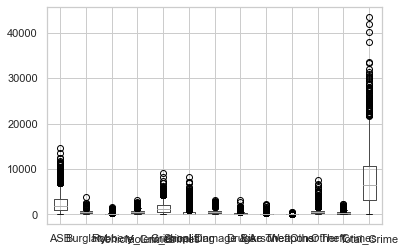

In [91]:
#boxplot to show outliers
boxplot = Crimedata1.boxplot(column=['ASB','Burglary', 'Robbery', 'Vehicle_Crimes','Violent_Crimes', 'Shoplifting', 'Criminal Damage & Arson', 'Drugs', 'Bike Theft', 'Weapons', 'Other Theft', 'Other Crimes', 'Total_Crime'])
plt.show() 

There are massive outliers when initally looking at the data, which will need to be standardised prior to analysis. It is also important to avoid the “curse of dimensionality”, reasoning [here]( https://www.researchgate.net/post/Which-would-you-use-first-K-Means-Clustering-or-Principal-Component-Analysis)

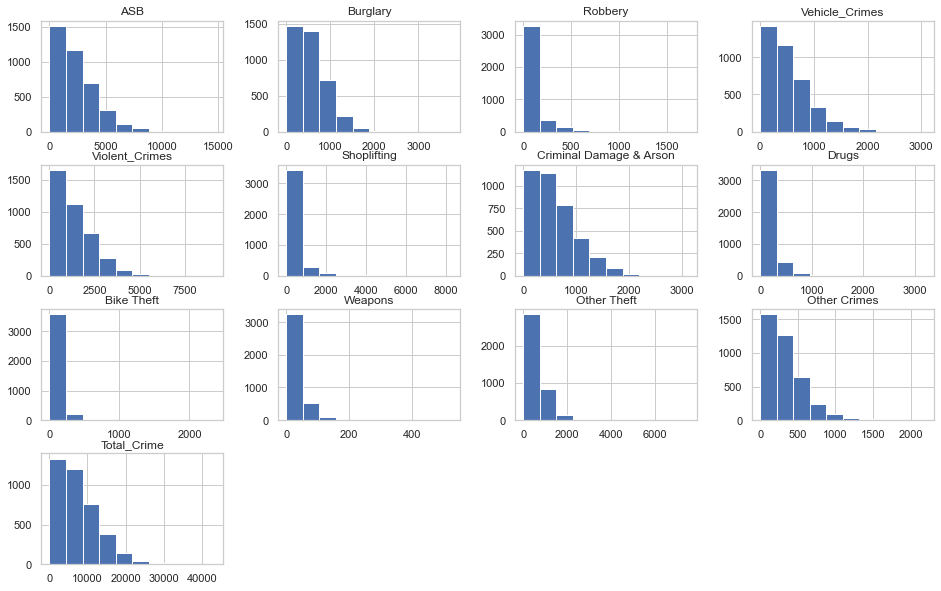

In [92]:
df_analyse_histograms = Crimedata1.hist(figsize = (16,10))

## Data Analysis <a class="anchor" id="Data Analysis"></a>


### Principal Component Analysis

These results indicate that unsupervised dimension reduction
is closely related to unsupervised learning. Too many dimensions to the data can cause too many clusters, meaning the data is difficult to interpret. Principal component analysis (PCA) is a
widely used statistical technique for unsupervised dimension reduction (Ding, n.d.)

Before perfroming principal component analysis, the datasets need to be standardised. 

In order to discover the most relevant standarising method to use, a ramdom column sample is standardised according to several methods; MinMax, Robust and StandardScaler.

In [95]:
#this is a temporary dataset
standarising_dataset = Crimedata1[['ASB', 'Burglary', 'Robbery', 'Violent_Crimes', 'Total_Crime']]
standarising_dataset.head(2)

,ASB,Burglary,Robbery,Violent_Crimes,Total_Crime
0,3003,852,403,2608,11139
1,2991,1115,264,2531,11783


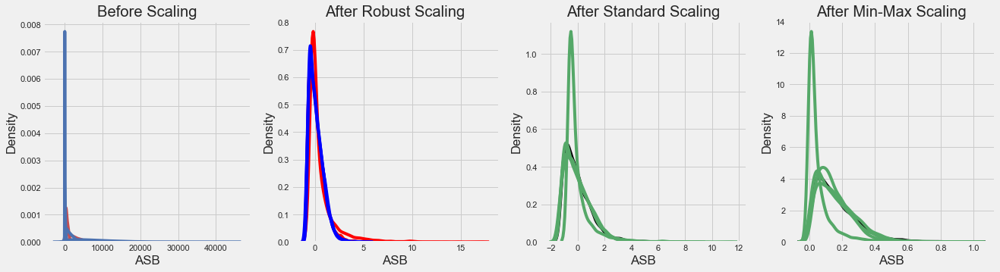

In [96]:
matplotlib.style.use('fivethirtyeight')

scaler = preprocessing.RobustScaler()
robust_df = scaler.fit_transform(standarising_dataset)
robust_df = pd.DataFrame(robust_df, columns =['ASB', 'Burglary', 'Robbery', 'Violent_Crimes', 'Total_Crime'])
  
scaler = preprocessing.StandardScaler()
standard_df = scaler.fit_transform(standarising_dataset)
standard_df = pd.DataFrame(standard_df, columns =['ASB', 'Burglary', 'Robbery', 'Violent_Crimes', 'Total_Crime'])
  
scaler = preprocessing.MinMaxScaler()
minmax_df = scaler.fit_transform(standarising_dataset)
minmax_df = pd.DataFrame(minmax_df, columns =['ASB', 'Burglary', 'Robbery', 'Violent_Crimes', 'Total_Crime'])
  
fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols = 4, figsize =(20, 5))
ax1.set_title('Before Scaling')

'Total_Crime'

sns.kdeplot(Crimedata1['ASB'], ax = ax1, color ='r')
sns.kdeplot(Crimedata1['Burglary'], ax = ax1, color ='r')
sns.kdeplot(Crimedata1['Robbery'], ax = ax1, color ='b')
sns.kdeplot(Crimedata1['Violent_Crimes'], ax = ax1, color ='b')
sns.kdeplot(Crimedata1['Total_Crime'], ax = ax1, color ='b')
ax2.set_title('After Robust Scaling')
  
sns.kdeplot(robust_df['ASB'], ax = ax2, color ='red')
sns.kdeplot(robust_df['Burglary'], ax = ax2, color ='blue')
sns.kdeplot(robust_df['Robbery'], ax = ax2, color ='red')
sns.kdeplot(robust_df['Violent_Crimes'], ax = ax2, color ='blue')
sns.kdeplot(robust_df['Total_Crime'], ax = ax2, color ='blue')
ax3.set_title('After Standard Scaling')
  
sns.kdeplot(standard_df['ASB'], ax = ax3, color ='black')
sns.kdeplot(standard_df['Burglary'], ax = ax3, color ='g')
sns.kdeplot(standard_df['Robbery'], ax = ax3, color ='g')
sns.kdeplot(standard_df['Violent_Crimes'], ax = ax3, color ='g')
sns.kdeplot(standard_df['Total_Crime'], ax = ax3, color ='g')
ax4.set_title('After Min-Max Scaling')
  
sns.kdeplot(minmax_df['ASB'], ax = ax4, color ='black')
sns.kdeplot(minmax_df['Burglary'], ax = ax4, color ='g')
sns.kdeplot(minmax_df['Robbery'], ax = ax4, color ='g')
sns.kdeplot(minmax_df['Violent_Crimes'], ax = ax4, color ='g')
sns.kdeplot(minmax_df['Total_Crime'], ax = ax4, color ='g')

plt.show()

The data seems most similar with Robust Scaling, therefore, Robust scaling will be used for standardising data. This corresponds with [this](https://scikit-learn.org/stable/auto_examples/preprocessing/plot_all_scaling.html) reasoning, as standard scaler cannot guarentee balanced feature scale in the presence of outliers, as is MinMix Scaling.

Robust Scaling will now be used throughout the report.

In [98]:
#loading the dataset with only crime data 
Crimedata1.head(2)

,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Drugs,Bike Theft,Weapons,Other Theft,Other Crimes,Total_Crime
0,3003,852,403,1097,2608,62,795,416,104,37,657,620,11139
1,2991,1115,264,1171,2531,277,773,401,99,49,1080,422,11783


In [147]:
Crimedata1.count()

ASB                        3867
Burglary                   3867
Robbery                    3867
Vehicle_Crimes             3867
Violent_Crimes             3867
Shoplifting                3867
Criminal Damage & Arson    3867
Drugs                      3867
Bike Theft                 3867
Weapons                    3867
Other Theft                3867
Other Crimes               3867
Total_Crime                3867
dtype: int64

In [99]:
#standardising the data using RobustScaler
df_st =  RobustScaler().fit_transform(Crimedata1)  
pd.DataFrame(df_st, columns=Crimedata1.columns).head(2)

,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Drugs,Bike Theft,Weapons,Other Theft,Other Crimes,Total_Crime
0,0.447268,0.769547,3.686869,1.326733,1.021335,-0.287234,0.484065,1.711816,0.8000,0.529412,0.365005,1.105512,0.648708
1,0.442186,1.310700,2.282828,1.473267,0.968341,0.284574,0.446167,1.625360,0.7375,0.882353,1.160865,0.481890,0.736548


In [148]:
Crimedata3 = pd.DataFrame(df_st, columns=Crimedata1.columns)
Crimedata3.head()

,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Drugs,Bike Theft,Weapons,Other Theft,Other Crimes,Total_Crime
0,0.447268,0.769547,3.686869,1.326733,1.021335,-0.287234,0.484065,1.711816,0.8000,0.529412,0.365005,1.105512,0.648708
1,0.442186,1.310700,2.282828,1.473267,0.968341,0.284574,0.446167,1.625360,0.7375,0.882353,1.160865,0.481890,0.736548
2,0.875900,1.119342,4.292929,2.956436,1.304198,2.388298,0.983635,1.072046,1.2125,1.323529,1.482596,1.313386,1.262634
3,0.342228,1.008230,3.656566,2.007921,1.121817,0.191489,0.654608,0.766571,1.0125,0.470588,0.370649,0.617323,0.698493
4,0.345616,0.884774,2.171717,1.273267,0.722643,-0.194149,0.294574,0.466859,0.0875,0.147059,0.991533,0.475591,0.488031


In [150]:
pca_out = PCA().fit(Crimedata1)

# get the component variance
# Proportion of Variance (from PC1 to PC6)
pca_out.explained_variance_ratio_
# output

# Cumulative proportion of variance (from PC1 to PC6)   
np.cumsum(pca_out.explained_variance_ratio_)
# output
#array([0.2978742 , 0.57268672, 0.80450114, 0.99741752, 0.99886105,
 #      1.        ])
       
# component loadings or weights (correlation coefficient between original variables and the component) 
# component loadings represents the elements of the eigenvector
# the squared loadings within the PCs always sums to 1
loadings = pca_out.components_
num_pc = pca_out.n_features_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings_df['variable'] = Crimedata1.columns.values
loadings_df = loadings_df.set_index('variable')
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
variable,,,,,,,,,,,,,
ASB,0.296277,-0.840136,0.282132,0.159216,-0.005020,-0.108124,-0.144296,0.068057,0.026575,0.032401,0.069325,-0.239037,0.023953
Burglary,0.045086,0.018300,-0.303407,0.118648,-0.431177,0.215698,0.215846,0.723301,0.025035,0.050250,0.167134,-0.239010,0.033083
Robbery,0.015712,0.062011,-0.085277,0.089383,0.013412,-0.271294,0.169998,0.019575,-0.180126,-0.275487,-0.732653,-0.481442,0.026036
Vehicle_Crimes,0.045553,0.086032,-0.393210,0.207796,-0.511992,-0.334594,-0.463506,-0.371555,0.088912,0.014747,0.164192,-0.174406,0.015857
Violent_Crimes,0.174126,0.008772,-0.316802,-0.671331,0.376764,-0.219734,-0.280462,0.220354,0.140374,0.017162,0.118070,-0.258424,0.019561
Shoplifting,0.069281,0.349088,0.733190,-0.280218,-0.356333,-0.071720,-0.175550,0.094046,-0.020363,-0.053586,0.096176,-0.269401,0.018889
Criminal Damage & Arson,0.063416,-0.127702,-0.139641,-0.287885,-0.142870,0.740078,-0.056335,-0.372142,-0.241822,-0.163048,-0.018730,-0.286374,0.008864
Drugs,0.026501,0.055373,-0.027906,0.041315,0.143261,-0.282010,0.502670,-0.211540,-0.412221,-0.102871,0.569633,-0.301934,-0.010593
Bike Theft,0.012963,0.052077,0.043981,0.063089,0.056915,0.100808,0.341239,-0.226508,0.839773,-0.121863,0.074648,-0.289919,0.018939


This will now load an SNS heatmap, which can subsequently be interpreted 

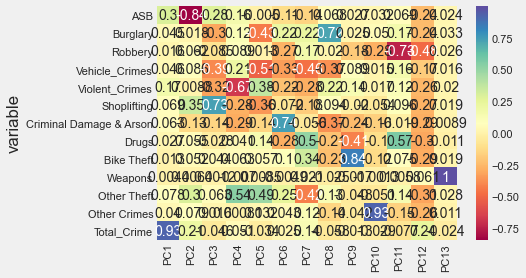

In [151]:
ax = sns.heatmap(loadings_df, annot=True, cmap='Spectral')
plt.show()

From this map, it seems like the factors that correlate the most are Total Crime, Weapons, Bike Theft, Burglary, Shoplifting, and Criminal Damage and Arson. This however will be confirmed with 2D Biplots and Scree plots

In [152]:
pca_out.explained_variance_
# output
#array([1.78994905, 1.65136965, 1.39299071, 1.15924943, 0.0086743 ,
 #      0.00684401])
# get scree plot (for scree or elbow test)
from bioinfokit.visuz import cluster
cluster.screeplot(obj=[pc_list, pca_out.explained_variance_ratio_])

Scree plot will be saved in the same directory with name screeplot.png PCA plot shows clusters of samples based on their similarity.

A scree is a diagnostic tool used to check whether Principal COmponent Analysis works on the data. Principal components contributes certain amounts of variation in the data, with PC1 capturing the most, and so on. If the 1st 2-3 PC captured most of the information, then we can exclude certain types without losing any important information.

In [153]:
# 2D
cluster.pcaplot(x=loadings[0], y=loadings[1], labels=Crimedata3.columns.values, 
    var1=round(pca_out.explained_variance_ratio_[0]*100, 2),
    var2=round(pca_out.explained_variance_ratio_[1]*100, 2))

A PCA plot shows clusters of samples based on their similarity. PCA doesn't discard any variables, but instead it reduces the number of dimensions. 

The 2D Biplot is the one most important data visualisation technique for this analysis, as it shows both PC scores of samples and loadings of variables in vector form. The further away these vectors are from a PC origin, the more influence they have on that PC. 

Loading plots also hint at how variables correlate with one another:

- a small angle implies positive correleation
- an obtuse angle implies negative correlation
- a 90 degree angle indicates no correlation between two characteristics. 

In [154]:
# get 2D biplot
pca_scores = PCA().fit_transform(df_st)

cluster.biplot(cscore=pca_scores, loadings=loadings, labels=Crimedata3.columns.values, var1=round(pca_out.explained_variance_ratio_[0]*100, 2),
    var2=round(pca_out.explained_variance_ratio_[1]*100, 2))

From this analysis, the variables that hold the most weight, and therefore will be included in this analysis, are Burglary, Violent Crimes, Drugs, Shoplifting, Total Crime. These variables will then be added onto the main dataset in place of the unstandardised variables, which will then be analysed using clustering.

In [155]:
#this is the standardised dataset
Crimedata3.head(5) 

,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Drugs,Bike Theft,Weapons,Other Theft,Other Crimes,Total_Crime
0,0.447268,0.769547,3.686869,1.326733,1.021335,-0.287234,0.484065,1.711816,0.8000,0.529412,0.365005,1.105512,0.648708
1,0.442186,1.310700,2.282828,1.473267,0.968341,0.284574,0.446167,1.625360,0.7375,0.882353,1.160865,0.481890,0.736548
2,0.875900,1.119342,4.292929,2.956436,1.304198,2.388298,0.983635,1.072046,1.2125,1.323529,1.482596,1.313386,1.262634
3,0.342228,1.008230,3.656566,2.007921,1.121817,0.191489,0.654608,0.766571,1.0125,0.470588,0.370649,0.617323,0.698493
4,0.345616,0.884774,2.171717,1.273267,0.722643,-0.194149,0.294574,0.466859,0.0875,0.147059,0.991533,0.475591,0.488031


In [157]:
#drop all the data columns 
Crimedata4 = Crimedata3.drop(columns=['ASB', 'Robbery', 'Vehicle_Crimes', 'Bike Theft', 'Criminal Damage & Arson', 'Weapons', 'Other Crimes', 'Other Theft'], axis =1)
Crimedata4.head(3)

,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime
0,0.769547,1.021335,-0.287234,1.711816,0.648708
1,1.310700,0.968341,0.284574,1.625360,0.736548
2,1.119342,1.304198,2.388298,1.072046,1.262634


In [159]:
#unstandardised - This is the main dataset
Crimedata.head(2)

,IMDScore,ASB,Burglary,Robbery,Vehicle_Crimes,Violent_Crimes,Shoplifting,Criminal Damage & Arson,Other Theft,Drugs,Other Crimes,Bike Theft,Weapons,Order,Theft From Person,Total_Crime,Population Density,latitude,longitude
0,39.004,3003,852,403,1097,2608,62,795,657,416,620,104,37,298,109,11139,59.393006,51.5529,0.1290
1,35.895,2991,1115,264,1171,2531,277,773,1080,401,422,99,49,429,89,11783,26.473129,51.5602,0.1792


Now the standardised datset is joined with the rest of the variables, sich as population density etc. 

In [160]:
Crimedata5 = Crimedata.drop(columns=['ASB', 'Order', 'Burglary', 'Violent_Crimes', 'Shoplifting', 'Drugs', 'Total_Crime', 'Robbery', 'Vehicle_Crimes', 'Bike Theft', 'Criminal Damage & Arson', 'Weapons', 'Other Crimes', 'Other Theft', 'Theft From Person'], axis =1)
Crimedata5.head(3)

,IMDScore,Population Density,latitude,longitude
0,39.004,59.393006,51.5529,0.1290
1,35.895,26.473129,51.5602,0.1792
2,29.788,86.853822,51.5529,0.1290


In [163]:
Final_Crime = pd.concat([Crimedata5, Crimedata4], axis=1)
Final_Crime.head(2)

,IMDScore,Population Density,latitude,longitude,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime
0,39.004,59.393006,51.5529,0.1290,0.769547,1.021335,-0.287234,1.711816,0.648708
1,35.895,26.473129,51.5602,0.1792,1.310700,0.968341,0.284574,1.625360,0.736548


In [164]:
Final_Crime.count()

IMDScore              3867
Population Density    3867
latitude              3867
longitude             3867
Burglary              3867
Violent_Crimes        3867
Shoplifting           3867
Drugs                 3867
Total_Crime           3867
dtype: int64

There are the same number of values in al columns, and the data is standardised. Kmeans clustering can now be performed. 

### Kmeans Clustering

Even if variables are of the same units but show quite different variances it is still a good idea to standardize before K-means. You see, K-means clustering is "isotropic" in all directions of space and therefore tends to produce more or less round (rather than elongated) clusters (Google Developers, n.d.).

In [165]:
Final_Crime.head(5)

,IMDScore,Population Density,latitude,longitude,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime
0,39.004,59.393006,51.5529,0.1290,0.769547,1.021335,-0.287234,1.711816,0.648708
1,35.895,26.473129,51.5602,0.1792,1.310700,0.968341,0.284574,1.625360,0.736548
2,29.788,86.853822,51.5529,0.1290,1.119342,1.304198,2.388298,1.072046,1.262634
3,30.898,63.845616,51.5529,0.1290,1.008230,1.121817,0.191489,0.766571,0.698493
4,27.895,87.900831,51.5461,0.1389,0.884774,0.722643,-0.194149,0.466859,0.488031


In [182]:
#Defining the ranges of crime data, in order to create a scale 
Final_Crime['Total_Crime'].describe()

count    3867.000000
mean        0.149439
std         0.741181
min        -0.867217
25%        -0.427539
50%         0.000000
75%         0.572461
max         5.063766
Name: Total_Crime, dtype: float64

We need to defina a scale for total crime, which is the independent variable, which indices the level of crime across the country. This column will be used for data visualisations. 

In [183]:
#need a category for totalcrime, which is the independent variable

def stars(column):
    if column["Total_Crime"] <= -0.427:
        return "Very Low"
    elif column["Total_Crime"] > -0.427 and column["Total_Crime"] <= 0:
        return "Low"
    elif column["Total_Crime"] > 0 and column["Total_Crime"] <= 0.572:
        return "Medium"
    else: 
        return "High"
    
TC = Final_Crime.apply(stars, axis='columns')
TC.head(5)

0      High
1      High
2      High
3      High
4    Medium
dtype: object

In [185]:
#Add category to the main column 
Final_Crime["TC"] = TC
Final_Crime.head(5)

,IMDScore,Population Density,latitude,longitude,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime,TC
0,39.004,59.393006,51.5529,0.1290,0.769547,1.021335,-0.287234,1.711816,0.648708,High
1,35.895,26.473129,51.5602,0.1792,1.310700,0.968341,0.284574,1.625360,0.736548,High
2,29.788,86.853822,51.5529,0.1290,1.119342,1.304198,2.388298,1.072046,1.262634,High
3,30.898,63.845616,51.5529,0.1290,1.008230,1.121817,0.191489,0.766571,0.698493,High
4,27.895,87.900831,51.5461,0.1389,0.884774,0.722643,-0.194149,0.466859,0.488031,Medium


In [186]:
location = (Final_Crime[['latitude','longitude']])
location_list = location.values.tolist()
len(location_list)
location_list[7] #prints the 7th number location, to demonstrate the functionality of the code 

[51.6476, -0.13062]

In [188]:
from shapely.geometry import Point

In [189]:
#converting to geodataframe

geometry = geopandas.points_from_xy(Final_Crime.longitude, Final_Crime.latitude)
geo_df = geopandas.GeoDataFrame(Final_Crime[['IMDScore','Population Density', 'Burglary', 'Violent_Crimes', 'Shoplifting', 'Drugs', 'Total_Crime', 'latitude', 'longitude', 'TC']], geometry=geometry)

geo_df.head()

,IMDScore,Population Density,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime,latitude,longitude,TC,geometry
0,39.004,59.393006,0.769547,1.021335,-0.287234,1.711816,0.648708,51.5529,0.1290,High,POINT (0.12900 51.55290)
1,35.895,26.473129,1.310700,0.968341,0.284574,1.625360,0.736548,51.5602,0.1792,High,POINT (0.17920 51.56020)
2,29.788,86.853822,1.119342,1.304198,2.388298,1.072046,1.262634,51.5529,0.1290,High,POINT (0.12900 51.55290)
3,30.898,63.845616,1.008230,1.121817,0.191489,0.766571,0.698493,51.5529,0.1290,High,POINT (0.12900 51.55290)
4,27.895,87.900831,0.884774,0.722643,-0.194149,0.466859,0.488031,51.5461,0.1389,Medium,POINT (0.13890 51.54610)


The dataframe must then be converted to a geodataframe in order to be able to plot using Floium - this viualisation technique is very useful for clustering analysis as the centroids are then visible, indicating the areas of most need. 

**Plotting the Map**:  Each postcode sector will be identified by a point with size proportional to its level of crime.

In [193]:
# Defining variables

x, y = "latitude", "longitude"
color = "TC"
size = "Total_Crime"
popup = "IMDScore"
data = geo_df.copy()

## create color column red', 'orange', 'green', 'purple'
lst_colors=["red","green","orange", "purple"]
lst_elements = sorted(list(Final_Crime[color].unique()))
data["color"] = data[color].apply(lambda x: 
                lst_colors[lst_elements.index(x)])

## create size column (scaled)
scaler = preprocessing.MinMaxScaler(feature_range=(3,15)) #maybe change to robust, but check the code works first
data["size"] = scaler.fit_transform(
               data[size].values.reshape(-1,1)).reshape(-1)

## initialize the map with the starting location
map_ = folium.Map(location = location_list[7], tiles="cartodbpositron",
                  zoom_start=11)

## add points
data.apply(lambda row: folium.CircleMarker(
           location=[row[x],row[y]], popup=row[popup],
           color=row["color"], fill=True,
           radius=row["size"]).add_to(map_), axis=1)

## add html legend
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
for i in lst_elements:
     legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
     fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+"""">
     </i>&nbsp;"""+str(i)+"""<br>"""
legend_html = legend_html+"""</div>"""
map_.get_root().html.add_child(folium.Element(legend_html))

## plot the map
map_

### The Elbow Method

In order to analyse the clusters and define the right K value, plotting the variance as a function of the number of clusters and picking the k that flats the curve.

Elbow Method is an empirical method to find the optimal number of clusters for a dataset. In this method, we pick a range of candidate values of k, then apply K-Means clustering using each of the values of k.

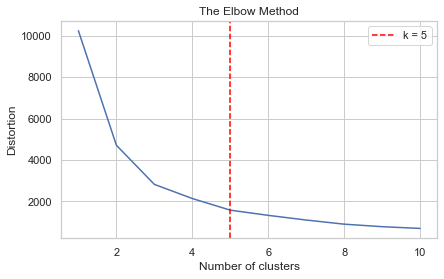

In [194]:
X = geo_df[["latitude","longitude"]]
max_k = 10

## iterations
distortions = [] 

for i in range(1, max_k+1):   
    if len(X) >= i:
       model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
       model.fit(X)
       distortions.append(model.inertia_)
    
## best k: the lowest derivative
k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i 
     in np.diff(distortions,2)]))

## plot
fig, ax = plt.subplots()
ax.plot(range(1, len(distortions)+1), distortions)
ax.axvline(k, ls='--', color="red", label="k = "+str(k))
ax.set(title='The Elbow Method', xlabel='Number of clusters', 
       ylabel="Distortion")
ax.legend()
ax.grid(True)
plt.show()

The elbow method indicates the value of K to be 5, however this can be verified through the silhouette score analysis

### Silhouette Score

**Silhouette Score** For higher-dimensional data, we can employ the Silhouette Method to find the best k, which is another alternative to the Elbow Method. Silhouette scoring is a metric used for validation while clustering, and is often used alongside the Elbow method for assurance as to the right value of K. A high Silhouette Score is desirable. 

In [213]:
geo_df.head(3)

,IMDScore,Population Density,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime,latitude,longitude,TC,geometry
0,39.004,59.393006,0.769547,1.021335,-0.287234,1.711816,0.648708,51.5529,0.1290,High,POINT (0.12900 51.55290)
1,35.895,26.473129,1.310700,0.968341,0.284574,1.625360,0.736548,51.5602,0.1792,High,POINT (0.17920 51.56020)
2,29.788,86.853822,1.119342,1.304198,2.388298,1.072046,1.262634,51.5529,0.1290,High,POINT (0.12900 51.55290)


In order to perform the silhouette score analysis, columns with non -int datatypes must be removed.

In [214]:
#drop useless columns 
geo_df1 = geo_df.drop(columns=[ 'TC', 'geometry'], axis =1)
geo_df1.head(2)

,IMDScore,Population Density,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime,latitude,longitude
0,39.004,59.393006,0.769547,1.021335,-0.287234,1.711816,0.648708,51.5529,0.1290
1,35.895,26.473129,1.310700,0.968341,0.284574,1.625360,0.736548,51.5602,0.1792


In [215]:
clusterer = KMeans(n_clusters=4) # random_state=10
cluster_labels = clusterer.fit_predict(geo_df1) #used to be 'X' 
print(cluster_labels)

[3 3 3 ... 3 3 0]


For n_clusters = 2 The average silhouette_score is : 0.555021343426742
For n_clusters = 3 The average silhouette_score is : 0.52406175130658
For n_clusters = 4 The average silhouette_score is : 0.4534105015161342
For n_clusters = 5 The average silhouette_score is : 0.4630981975933994
For n_clusters = 6 The average silhouette_score is : 0.43956241358802867
For n_clusters = 7 The average silhouette_score is : 0.41611274232761697


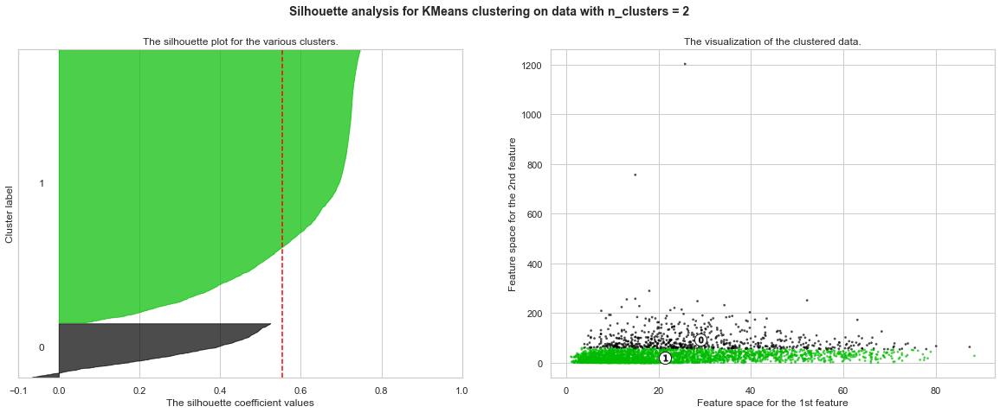

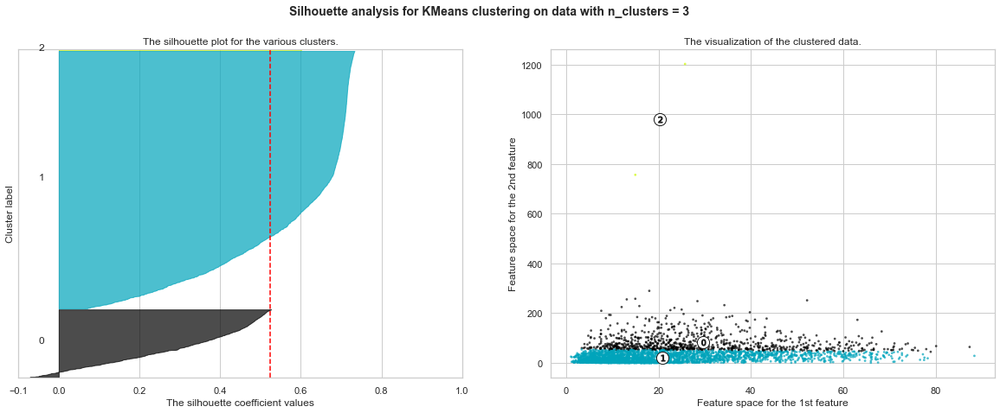

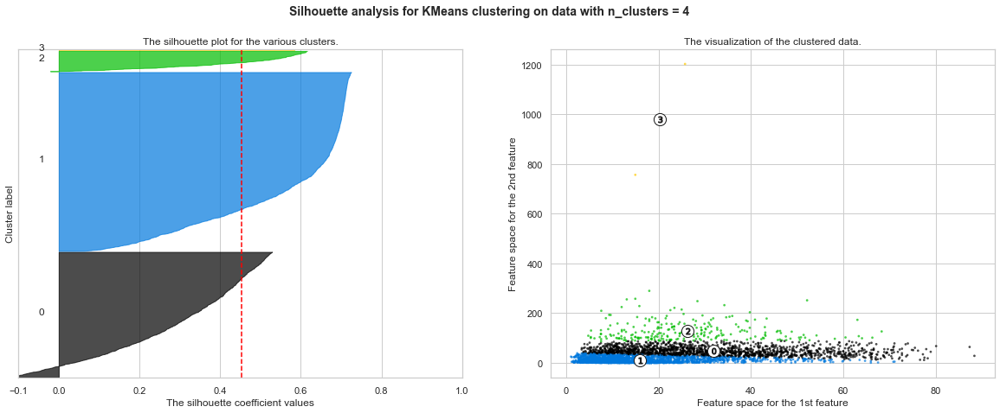

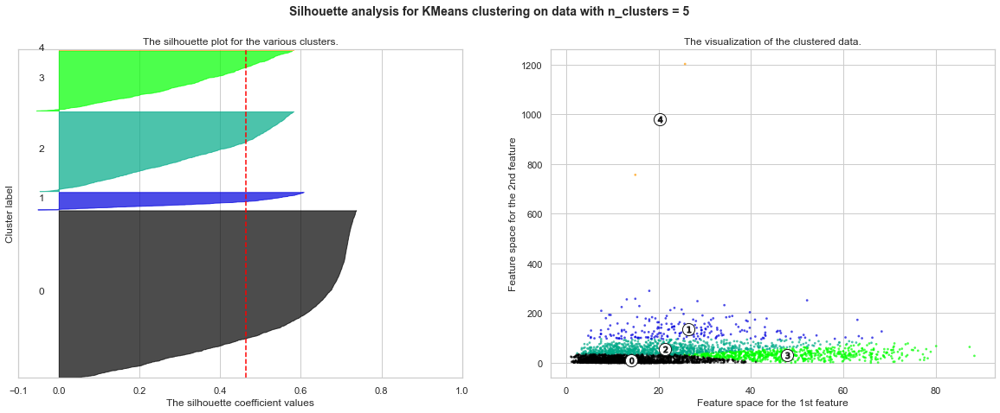

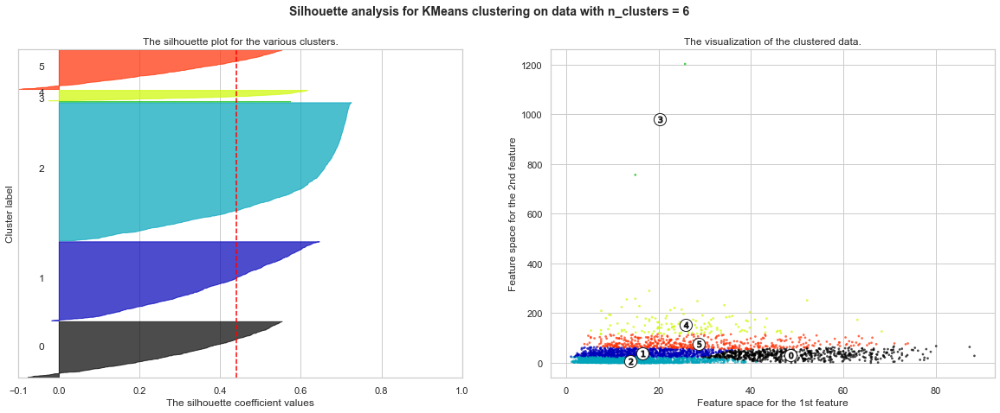

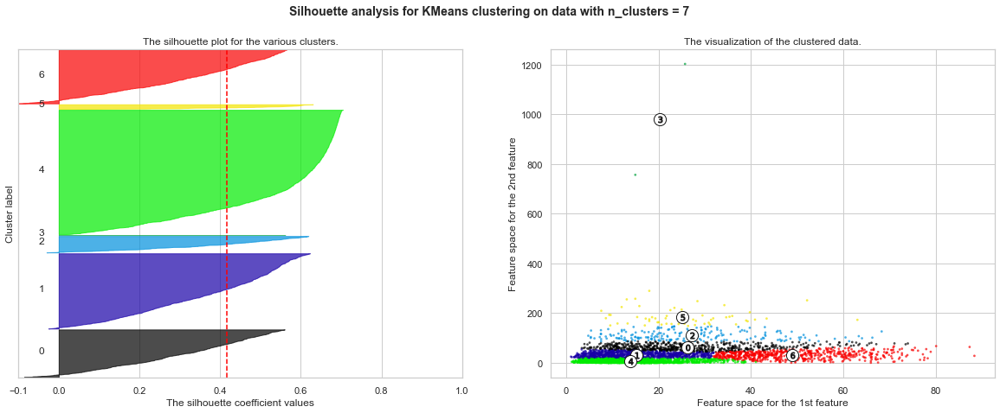

In [227]:
range_n_clusters = [2, 3, 4, 5, 6, 7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(geo_df1) + (n_clusters + 1) * 10])#was an x there 

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(geo_df1)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    
    silhouette_avg = silhouette_score(geo_df1, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(geo_df1, cluster_labels) #was X

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(geo_df1.iloc[:, 0], geo_df1.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    
plt.show()

The value of either 4 or 5 for n_clusters looks to be the optimal one. 

There is a similar fluctuation in zive between 4 and 5, and although 2 and 3 have a higher silhouette score, the range of data suggests that a greater K is needed. The thickness of the silhouette plot representing each cluster also is a deciding point. For K=4, the thickness is more uniform than 5, whcih has a very large range of thickness. Thus, one can select the best number of clusters as 5.


In [222]:
k = 5

model = cluster.KMeans(n_clusters=k, init='k-means++')
X = geo_df[["latitude","longitude"]]

## clustering
dtf_X = X.copy()
dtf_X["cluster"] = model.fit_predict(X)

## find real centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                     dtf_X.drop("cluster", axis=1).values)
dtf_X["centroids"] = 0
for i in closest:
    dtf_X["centroids"].iloc[i] = 1

## add clustering info to the original dataset
geo_df[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]
geo_df.sample(5)

C:\Users\Owner\anaconda3\envs\sds2020\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,IMDScore,Population Density,Burglary,Violent_Crimes,Shoplifting,Drugs,Total_Crime,latitude,longitude,TC,geometry,cluster,centroids
2730,25.406,1.627528,-0.004115,-0.443221,-0.446809,-0.478386,-0.465798,51.6903,0.029667,Very Low,POINT (0.02967 51.69030),1,0
1534,28.383,8.332765,0.829218,0.261528,-0.345745,-0.247839,0.123849,53.7187,-1.945800,Medium,POINT (-1.94580 53.71870),3,0
983,55.692,41.415608,0.298354,0.973847,4.164894,2.443804,1.117370,53.6254,-3.020100,High,POINT (-3.02010 53.62540),0,0
1051,42.454,11.595788,-0.014403,0.017206,0.829787,-0.115274,0.139126,53.6084,-1.382629,Medium,POINT (-1.38263 53.60840),3,0
1958,27.355,58.431688,1.382716,1.631108,2.566489,1.769452,1.669235,51.4620,-2.551900,High,POINT (-2.55190 51.46200),2,0


Two columns are then added to the dataset: “cluster” which indicates what cluster the observation belongs to, and “centroids” that is 1 if an observation is also the closest to the centre, in which case it would be named 1, and 0 otherwise.


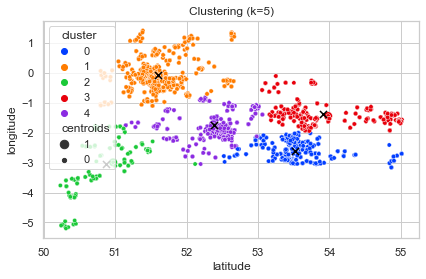

In [224]:
## plotting clusters with centroids added.
fig, ax = plt.subplots()
sns.scatterplot(x="latitude", y="longitude", data=geo_df, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend="brief", ax=ax).set_title('Clustering (k='+str(k)+')')
th_centroids = model.cluster_centers_
ax.scatter(th_centroids[:,0], th_centroids[:,1], s=50, c='black', 
           marker="x")

Now it is possible to visualise the clusters across the UK, with centroid data added.

In [229]:
x, y = "latitude", "longitude"
color = "TC"
size = "Total_Crime"
popup = "IMDScore"
marker = "centroids"
data = geo_df.copy()

## create color column
lst_elements = sorted(list(geo_df[color].unique()))
lst_colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for i in range(len(lst_elements))]
data["color"] = data[color].apply(lambda x: lst_colors[lst_elements.index(x)])

## create size column (scaled)
scaler = preprocessing.MinMaxScaler(feature_range=(3,15))
data["size"] = scaler.fit_transform(data[size].values.reshape(-1,1)).reshape(-1)

## initialize the map with the starting location
map_ = folium.Map(location=location_list[7], tiles="cartodbpositron", zoom_start=11)

## add points
data.apply(lambda row: folium.CircleMarker(
           location=[row[x],row[y]], popup=row[popup],
           color=row["color"], fill=True,
           radius=row["size"]).add_to(map_), axis=1)

## add html legend
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
for i in lst_elements:
     legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
     fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+"""">
     </i>&nbsp;"""+str(i)+"""<br>"""
legend_html = legend_html+"""</div>"""
map_.get_root().html.add_child(folium.Element(legend_html))

## add centroids marker
lst_elements = sorted(list(geo_df[marker].unique()))
data[data[marker]==1].apply(lambda row: 
           folium.Marker(location=[row[x],row[y]], 
           popup=row[marker], draggable=False,          
           icon=folium.Icon(color="black")).add_to(map_), axis=1)

## plot the map
map_

## Conclusion and Discussion of Results <a class="anchor" id="Discussion of Results and Research Questions"></a>

In conclusion, this paper has carried out principal component analysis and clustering of crime data across the UK in order to answer the following reserach question:

 _How can you identify areas of the country that are higher risk for certain incidents of crime?_

Each centroid can be seen as representing the "average observation" within a cluster across all the variables in the analysis
Some variations are observed across the country, initially confirming that many clusters are city-based. However, some anomolies are observed, for example of the centroids is centred seemingly not in a city, but outside, nearer the coastline. Although the distance values are not very informative by themselves, it is possible to compare the distances, with a larger distance generally indicating a greater difference between the clusters.

The implication from this map is that there are postcode-level differences across the country, depending on the level of crime committed, and factors such as the Deprivation data. 

This model is not designed for prediciton, more to identify the geographical areas in which specific areas require additional assistance. Its aim is not only for the police, but for social services, communiy organisations, to decide where to direct funding and resources as a crime preventitive measure. 

#### Limitations to the model

This report did not take into account demographic data of specific people, such as average age, race, ethnicity, earning potential etc. This model also did not take into account cities and landmarks, which can be an influential factor in crime prediction (Kounadi et al., 2020). 



## Bibliography <a class="anchor" id="Bibliography"></a>

Adel, H., Salheen, M. and Mahmoud, R., 2016. Crime in relation to urban design. Case study: The Greater Cairo Region. Ain Shams Engineering Journal, 7(3), pp.925-938. ((Adel, Salheen and Mahmoud, 2016))

Brantingham, P.L. and Brantingham, P.J., (1981). Notes on the geometry of crime. In P.J. Brantingham and P.L. Brantingham (eds.) Environmental Criminology, Beverly Hills, CA: Sage Publications (Brantingham, and Brantingham, 1981)

Bogomolov, Andrey & Lepri, Bruno & Staiano, Jacopo & Oliver, Nuria & Pianesi, Fabio & Pentland, Alex. (2014). Once Upon a Crime: Towards Crime Prediction from Demographics and Mobile Data. (Bogomolov et al, 2014)

Chen, H., Chung, W., Xu, J., Wang, G., Qin, Y. and Chau, M., 2004. Crime data mining: a general framework and some examples. Computer, [online] 37(4), pp.50-56. Available at: <https://ieeexplore.ieee.org/abstract/document/1297301> [Accessed 10 April 2021]. (Chen et al., 2004)

Clarke, M. (2017). REASONING CRIMINAL : rational choice perspectives on offending. Transaction Publishers.(Clarke, 2017)

Corcoran, J.J., Wilson, I.D. and Ware, J.Andrew. (2003). Predicting the geo-temporal variations of crime and disorder. International Journal of Forecasting, 19(4), pp.623–634. (Corcoran, Wilson and Ware, 2003)

Cuthbertson, P. (2018). Poverty and Crime: Why a new war on criminals would help the poor most. [online] . Available at: https://www.civitas.org.uk/content/files/povertyandcrime.pdf [Accessed 9 Apr. 2021].(Cuthbertson, 2018)

Ding, C. (n.d.). K-means Clustering via Principal Component Analysis. [online] . Available at: https://ranger.uta.edu/~chqding/papers/KmeansPCA1.pdf [Accessed 6 Apr. 2021].

Gnanasigamani, L.J. and Hari, S. (2019). Crime Data Clustering Using Neighbourhood Rough Set. Journal of Advanced Research in Dynamical and Control Systems, [online] 11(11-SPECIAL ISSUE), pp.478–484. Available at: https://www.researchgate.net/publication/338211674_Crime_Data_Clustering_Using_Neighbourhood_Rough_Set [Accessed 12 Apr. 2021].(Gnanasigamani and Hari, 2019)

Google Developers. (n.d.). k-Means Advantages and Disadvantages | Clustering in Machine Learning. [online] Available at: https://developers.google.com/machine-learning/clustering/algorithm/advantages-disadvantages#:~:text=Advantages%20of%20k%2Dmeans&text=Guarantees%20convergence. [Accessed 10 May 2021].

John, W., John, E., Michael, L. and James, C. (n.d.). Special Mapping Crime: Understanding Hot Spots. [online] . Available at: https://www.ojp.gov/pdffiles1/nij/209393.pdf [Accessed 24 Feb. 2021].(John et al., n.d.) 

Kerr, J., 2021. Vancouver police go high tech to predict and prevent crime before it happens. [online] Vancouver Courier. Available at: <https://www.vancourier.com/news/vancouver-police-go-high-tech-to-predict-and-prevent-crime-before-it-happens-1.21295288.> [Accessed 8 May 2021]. (Kerr, 2021)

Kirchmaier, T. and Villa-Llera, C. (2020). Covid-19 Analysis Series Covid-19 and changing crime trends in England and Wales. [online] . Available at: https://cep.lse.ac.uk/pubs/download/cepcovid-19-013.pdf.(Kirchmaier and Villa-Llera, 2020)

Kounadi, O., Ristea, A., Araujo, A. and Leitner, M. (2020). A systematic review on spatial crime forecasting. Crime Science, 9(1).

M. A. Boni and M. S. Gerber, "Area-Specific Crime Prediction Models," 2016 15th IEEE International Conference on Machine Learning and Applications (ICMLA), 2016, pp. 671-676, doi: 10.1109/ICMLA.2016.0118.(Boni and Gerber, 2016)

Malathi, A. and Santhosh Baboo, S. (2011). An Enhanced Algorithm to Predict a Future Crime using Data Mining. International Journal of Computer Applications, 21(1), pp.1–6. (A and Santhosh Baboo, 2011)

McClendon, L. and Meghanathan, N., 2015. Using Machine Learning Algorithms to Analyze Crime Data. Machine Learning and Applications: An International Journal, 2(1), pp.1-12.(McClendon and Meghanathan, 2015)

Ministry of Housing, Communities & Local Government (2019). English indices of deprivation 2019. [online] GOV.UK. Available at: https://www.gov.uk/government/statistics/english-indices-of-deprivation-2019.

Mundia, L., Matzin, R., Mahalle, S., Hamid, H. and Osman, R. (2016). Contributions of sociodemographic factors to criminal behavior. Psychology Research and Behavior Management, [online] p.147. Available at: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4922861/ [Accessed 16 Apr. 2020].(Mundia et al., 2016)

Rossmo, D. K. (2013). Geographic profiling. In G. Bruinsma & D. L. Weisburd (Eds.), Encyclopedia of criminology and criminal justice (pp. 1934-1942). New York: Springer.(Rossmo, 2013)

S, S., 2016. Crime prediction and forecasting in Tamilnadu using clustering approaches. [online] India. Available at: <https://ieeexplore.ieee.org/abstract/document/7873764> [Accessed 8 March 2021]. (S, 2016)

Udo, S. (2018). Towards Crime Forecasting Using Deep Learning. [Masters Dissertation] Available at: https://www.researchgate.net/publication/330777194_Towards_Crime_Forecasting_Using_Deep_Learning [Accessed 13 Apr. 2021].(Udo, 2018)

Understanding Herefordshire (2021). Crime deprivation - Understanding Herefordshire. [online] understanding.herefordshire.gov.uk. Available at: https://understanding.herefordshire.gov.uk/inequalities/index-of-multiple-deprivation-imd/crime-deprivation/ [Accessed 6 Apr. 2021].(Understanding Herefordshire, 2021)

Wadhai, C.G., Kakade, T.P., Bokde, K.A. and Tumsare, D.S. (2018). Crime Analysis Using K-Means Clustering. International Journal of Engineering Research & Technology, [online] 7(4). Available at: https://www.ijert.org/crime-analysis-using-k-means-clustering#:~:text=To%20perform%20crime%20analysis%20appropriate [Accessed 13 Apr. 2021]. (Wadhai et al., 2018)

Yerpude, P. and Gudur, V., 2017. Predictive Modelling of Crime Dataset Using Data Mining. International Journal of Data Mining & Knowledge Management Process, [online] 7(4), pp.43-58. Available at: <https://papers.ssrn.com/sol3/papers.cfm?abstract_id=3656953> [Accessed 9 April 2020]. (Yerpude and Gudur, 2017)


## Appendix <a class="anchor" id="Appendix"></a>

The original data is available [here](https://github.com/LillyCacciasaurus/Crime_Clustering/tree/main/Data), hosted via GitHub